<a href="https://colab.research.google.com/github/RashedujjamanNoor/Currency-Converter/blob/main/sentiment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
#import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb

In [2]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.decomposition import PCA

In [3]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import VotingClassifier

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.gaussian_process import GaussianProcessClassifier

# Additional models
from sklearn.linear_model import RidgeClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier

In [4]:
from sklearn.metrics import confusion_matrix, accuracy_score,classification_report
from sklearn.metrics import roc_curve, auc

In [12]:
import pandas as pd
#titanic_data= pd.read_csv('titanic.csv')
titanic_data = pd.read_csv('/content/sentiments.csv')

In [13]:
titanic_data.shape

(1015, 3)

In [14]:
print(titanic_data.shape)
print(titanic_data.index)
print(titanic_data.columns)
print(len(titanic_data.columns))

(1015, 3)
RangeIndex(start=0, stop=1015, step=1)
Index(['User_Name', 'Comments', 'Sentiment'], dtype='object')
3


In [15]:
titanic_data.head(n=5)

,User_Name,Comments,Sentiment
0,Mr Jamil,Very bad quality. It sounds good in one ear bu...,Negative
1,Md K.,It connects fine but no music sound,Negative
2,leon R.,"It's a bad product, one ear doesn't sound good...",Negative
3,Antor R.,Left listen to an uncomfortable feeling like o...,Neutral
4,Tushar,2 days time review Dildam. Fairly good for the...,Neutral


In [16]:
titanic_data.tail(5)

,User_Name,Comments,Sentiment
1010,MD. Z,"I like it very much. 😇Quite strong,,but not ab...",Positive
1011,1****567,"Yes seen,,,it can take the weight of a heavy j...",Positive
1012,Md. H,Alhamdulillah the product is very good,Positive
1013,E'mon I.,"Very good received,, everyone can take it, mad...",Positive
1014,I R,💞🌹Wow🌹💞😱😱😱💞💞 The items are very beautiful 🌹🌹🌹S...,Positive


In [17]:
#titanic_data.drop("Cabin", axis=1,inplace=True)
titanic_data.drop(["User_Name"],axis=1,inplace=True)
titanic_data.head(5)

,Comments,Sentiment
0,Very bad quality. It sounds good in one ear bu...,Negative
1,It connects fine but no music sound,Negative
2,"It's a bad product, one ear doesn't sound good...",Negative
3,Left listen to an uncomfortable feeling like o...,Neutral
4,2 days time review Dildam. Fairly good for the...,Neutral


In [18]:
titanic_data.tail()

,Comments,Sentiment
1010,"I like it very much. 😇Quite strong,,but not ab...",Positive
1011,"Yes seen,,,it can take the weight of a heavy j...",Positive
1012,Alhamdulillah the product is very good,Positive
1013,"Very good received,, everyone can take it, mad...",Positive
1014,💞🌹Wow🌹💞😱😱😱💞💞 The items are very beautiful 🌹🌹🌹S...,Positive


In [19]:
titanic_data.info()
#print(titanic_data.info()) #Formated

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1015 entries, 0 to 1014
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Comments   1015 non-null   object
 1   Sentiment  1014 non-null   object
dtypes: object(2)
memory usage: 16.0+ KB


In [20]:
titanic_data.describe()
#print(titanic_data.describe())

,Comments,Sentiment
count,1015,1014
unique,841,6
top,"Clocks according to price are correct, date an...",Positive
freq,6,473


In [21]:
titanic_data.isnull()

,Comments,Sentiment
0,False,False
1,False,False
2,False,False
3,False,False
4,False,False
...,...,...
1010,False,False
1011,False,False
1012,False,False
1013,False,False


In [22]:
titanic_data.isnull().sum()

,0
Comments,0
Sentiment,1


In [28]:
titanic_data['Sentiment'].mode()
titanic_data['Sentiment'].mode()[0]

'Positive'

In [29]:
titanic_data['Sentiment']=titanic_data['Sentiment'].fillna(titanic_data['Sentiment'].mode()[0])

titanic_data.isnull().sum()

,0
Comments,0
Sentiment,0


<Axes: xlabel='Sentiment', ylabel='count'>

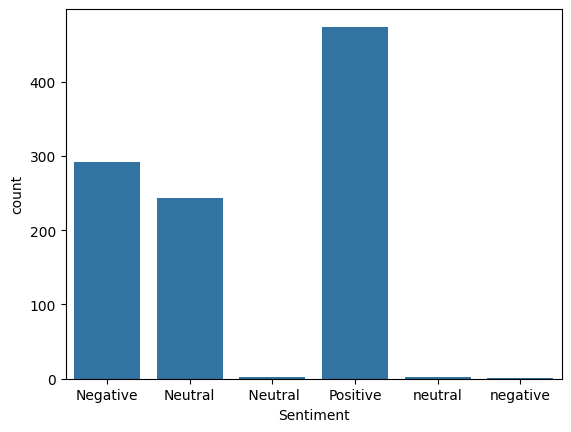

In [30]:
sb.countplot(x='Sentiment',data=titanic_data)

<Axes: xlabel='Comments', ylabel='count'>

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 128150 (\N{SPARKLING HEART}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 129325 (\N{SMILING FACE WITH SMILING EYES AND HAND COVERING MOUTH}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 127800 (\N{CHERRY BLOSSOM}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 129296 (\N{ZIPPER-MOUTH FACE}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 129402 (\N{FACE WITH PLEADING EYES}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 128148 (\N{BROKEN HEART}) missing fr

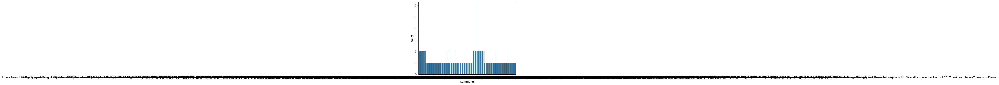

In [31]:
sb.countplot(x='Comments',data=titanic_data)

In [25]:
sb.countplot(x='Sentiment',hue='Comments',data=titanic_data)

<Axes: xlabel='Sentiment', ylabel='count'>

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 128150 (\N{SPARKLING HEART}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 129325 (\N{SMILING FACE WITH SMILING EYES AND HAND COVERING MOUTH}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 127800 (\N{CHERRY BLOSSOM}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 129296 (\N{ZIPPER-MOUTH FACE}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 129402 (\N{FACE WITH PLEADING EYES}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 128148 (\N{BROKEN HEART}) missing fr

<Axes: xlabel='Comments', ylabel='count'>

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 128150 (\N{SPARKLING HEART}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 129325 (\N{SMILING FACE WITH SMILING EYES AND HAND COVERING MOUTH}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 127800 (\N{CHERRY BLOSSOM}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 129296 (\N{ZIPPER-MOUTH FACE}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 129402 (\N{FACE WITH PLEADING EYES}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 128148 (\N{BROKEN HEART}) missing fr

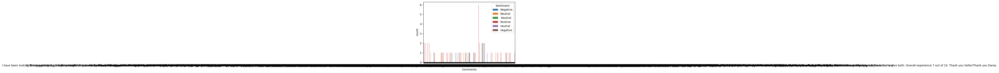

In [32]:
plt.figure(figsize=(6, 4))
sb.countplot(x='Comments',hue='Sentiment',data=titanic_data)

In [34]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
#titanic_data.Embarked = le.fit_transform(titanic_data.Embarked)
titanic_data.Comments = le.fit_transform(titanic_data.Comments)
titanic_data.Sentiment = le.fit_transform(titanic_data.Sentiment)

titanic_data

,Comments,Sentiment
0,745,1
1,390,1
2,432,1
3,445,2
4,4,0
...,...,...
1010,315,3
1011,802,3
1012,72,3
1013,760,3


In [35]:
# Step 4: Split the Data into Training and Testing Sets
X = titanic_data.drop(['Sentiment'], axis=1)  # Features
y = titanic_data['Sentiment']  # Target variable

#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [36]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X)
print(X)
print(X.shape)

[[ 1.33424046]
 [-0.12466877]
 [ 0.04793458]
 ...
 [-1.43152266]
 [ 1.39588451]
 [ 1.71232397]]
(1015, 1)


In [37]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
#from sklearn.cross_validation import train_test_split # Depricated

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [38]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(812, 1)
(203, 1)
(812,)
(203,)


In [39]:
print(X_train)
print(y_train)
print(X_test)
print(y_test)

[[ 6.43827076e-01]
 [ 4.99990956e-01]
 [-9.54808664e-01]
 [-2.27408854e-01]
 [-3.54806561e-01]
 [ 6.47936680e-01]
 [ 1.39177490e+00]
 [ 1.67533754e+00]
 [-1.34111139e+00]
 [ 1.67944714e+00]
 [ 2.90401180e-01]
 [-4.24766993e-02]
 [-1.10686399e+00]
 [-2.89052906e-01]
 [ 7.25921972e-02]
 [-1.27124813e+00]
 [-7.73986113e-01]
 [ 5.41086990e-01]
 [-1.45216785e-01]
 [-3.83573785e-01]
 [-1.26302892e+00]
 [-3.42574924e-02]
 [ 4.30127697e-01]
 [-1.61655199e-01]
 [ 1.38355570e+00]
 [ 1.19451394e+00]
 [ 8.24649628e-01]
 [-9.91795095e-01]
 [-7.53535268e-02]
 [-1.71919491e+00]
 [ 1.71232397e+00]
 [ 5.49306197e-01]
 [-1.33700179e+00]
 [ 1.19040433e+00]
 [ 1.45341896e+00]
 [ 5.98621438e-01]
 [ 1.61780309e+00]
 [-1.72330451e+00]
 [-7.61657302e-01]
 [-1.60001641e+00]
 [-7.53438096e-01]
 [ 4.95881352e-01]
 [ 2.08209111e-01]
 [-1.56302997e+00]
 [-7.24670871e-01]
 [ 9.80814559e-01]
 [ 1.43287094e+00]
 [-3.42477751e-01]
 [ 4.83552542e-01]
 [-5.93163561e-01]
 [ 7.13690335e-01]
 [-7.04122854e-01]
 [ 5.9451183

In [40]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.gaussian_process import GaussianProcessClassifier

# Additional models
from sklearn.linear_model import RidgeClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier

In [41]:
from sklearn.ensemble import RandomForestClassifier
model=RandomForestClassifier()
model.fit(X_train,y_train)
y_pred=model.predict(X_test)
y_pred

array([1, 3, 1, 3, 2, 1, 3, 1, 1, 3, 3, 1, 1, 3, 1, 2, 1, 3, 1, 1, 2, 3,
       1, 3, 3, 2, 3, 3, 2, 2, 1, 3, 3, 3, 3, 2, 1, 3, 2, 2, 1, 2, 3, 1,
       1, 3, 3, 2, 3, 3, 2, 1, 3, 3, 2, 1, 2, 1, 2, 3, 1, 3, 1, 3, 3, 1,
       3, 3, 1, 3, 3, 2, 3, 2, 1, 3, 3, 3, 2, 2, 1, 3, 2, 3, 2, 1, 3, 1,
       3, 3, 3, 3, 1, 1, 3, 1, 3, 3, 3, 3, 3, 3, 2, 3, 2, 2, 3, 1, 1, 2,
       3, 1, 3, 1, 2, 2, 1, 3, 1, 3, 3, 2, 1, 2, 3, 2, 1, 2, 2, 1, 2, 3,
       1, 3, 2, 3, 3, 3, 3, 3, 2, 1, 3, 1, 3, 2, 2, 3, 1, 1, 2, 2, 3, 2,
       3, 3, 3, 3, 1, 1, 2, 1, 2, 1, 3, 3, 1, 2, 1, 3, 3, 1, 3, 2, 1, 3,
       2, 3, 3, 3, 1, 3, 1, 2, 1, 3, 2, 3, 1, 2, 2, 1, 1, 1, 3, 3, 2, 2,
       3, 3, 2, 1, 3])

In [42]:
from sklearn.metrics import confusion_matrix, accuracy_score,classification_report
cm=confusion_matrix(y_pred,y_test)
cm

array([[38,  9, 14],
       [11, 23, 18],
       [18, 11, 61]])

In [43]:
print(accuracy_score(y_pred,y_test))

0.6009852216748769


In [44]:
print(classification_report(y_pred,y_test))

              precision    recall  f1-score   support

           1       0.57      0.62      0.59        61
           2       0.53      0.44      0.48        52
           3       0.66      0.68      0.67        90

    accuracy                           0.60       203
   macro avg       0.59      0.58      0.58       203
weighted avg       0.60      0.60      0.60       203



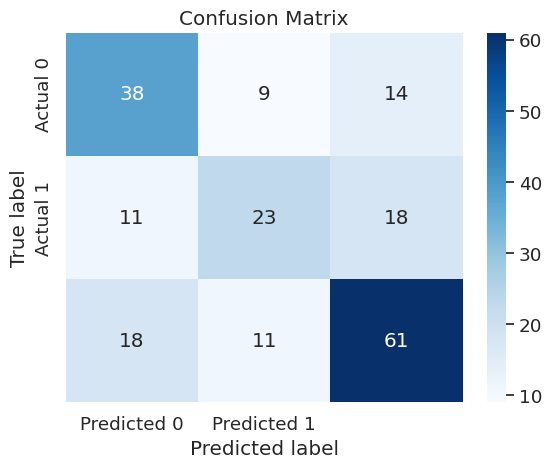

In [55]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(font_scale=1.2)
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues',
            xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['Actual 0', 'Actual 1'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()

In [46]:
cr=classification_report(y_pred,y_test)
print(cr)

              precision    recall  f1-score   support

           1       0.57      0.62      0.59        61
           2       0.53      0.44      0.48        52
           3       0.66      0.68      0.67        90

    accuracy                           0.60       203
   macro avg       0.59      0.58      0.58       203
weighted avg       0.60      0.60      0.60       203



In [47]:
from sklearn.metrics import roc_curve, auc
fpr, tpr, thresholds = roc_curve(y_test, y_pred)

# Calculate the Area Under the Curve (AUC)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

ValueError: multiclass format is not supported

In [48]:
from sklearn.metrics import roc_curve, auc
fpr, tpr, thresholds = roc_curve(y_test, y_pred)

# Calculate the Area Under the Curve (AUC)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

ValueError: multiclass format is not supported

In [49]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

# Create a RandomForestClassifier (replace this with your classifier of choice)
classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Create StratifiedKFold with c=10 folds
stratified_kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Perform stratified cross-validation
cv_results = cross_val_score(classifier, X, y, cv=stratified_kfold, scoring='accuracy')

# Print the results
print("Cross-validation results:")
print(cv_results)
print(f"Mean accuracy: {cv_results.mean():.2f}")

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=10.
  warnings.warn(


Cross-validation results:
[0.60784314 0.65686275 0.69607843 0.70588235 0.62745098 0.58415842
 0.57425743 0.62376238 0.6039604  0.58415842]
Mean accuracy: 0.63


In [50]:
# Initialize an empty confusion matrix
overall_conf_matrix = np.zeros((2, 2))

# Perform stratified cross-validation and obtain predictions
for train_index, test_index in stratified_kfold.split(X, y):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_test)

    # Calculate confusion matrix for each fold
    fold_conf_matrix = confusion_matrix(y_test, y_pred, labels=[0, 1])

    # Add the confusion matrix to the overall confusion matrix
    overall_conf_matrix += fold_conf_matrix

# Print the overall confusion matrix
print("Overall Confusion Matrix:")
print(overall_conf_matrix)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=10.
  warnings.warn(


Overall Confusion Matrix:
[[  2.   0.]
 [  1. 182.]]


In [51]:
from sklearn.metrics import roc_curve, auc
# Initialize variables to store true labels and predicted probabilities
true_labels = []
predicted_probabilities = []
# Perform stratified cross-validation and obtain predicted probabilities
for train_index, test_index in stratified_kfold.split(X, y):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    classifier.fit(X_train, y_train)
    y_prob = classifier.predict_proba(X_test)[:, 1]

    true_labels.extend(y_test)
    predicted_probabilities.extend(y_prob)

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(true_labels, predicted_probabilities)


# Calculate the Area Under the Curve (AUC)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=10.
  warnings.warn(


ValueError: multiclass format is not supported

In [52]:
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

# Create individual classifiers
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
logistic_classifier = LogisticRegression(random_state=42)
svm_classifier = SVC(probability=True, random_state=42)
knn_classifier = KNeighborsClassifier()

# Create a list of tuples, where each tuple contains a name for the classifier and the classifier instance
classifiers = [('Random Forest', rf_classifier),
               ('Logistic Regression', logistic_classifier),
               ('SVM', svm_classifier),
               ('KNN', knn_classifier)]

# Create a VotingClassifier
#VotingClassifier(estimators=classifiers, voting='hard')
voting_classifier = VotingClassifier(estimators=classifiers, voting='hard')  # You can use 'soft' for probabilities

# Now you can fit and use the voting_classifier as a regular classifier
voting_classifier.fit(X_train, y_train)
predictions = voting_classifier.predict(X_test)
print(accuracy_score(y_pred,y_test))

0.5841584158415841


In [53]:
from sklearn.decomposition import PCA
#pca = PCA()               # All components
#pca = PCA(n_components=1)  # 1 components
pca = PCA(n_components=2) # 2 components
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)
#print(pca)
print(X_train)

ValueError: n_components=2 must be between 0 and min(n_samples, n_features)=1 with svd_solver='covariance_eigh'

In [54]:
model=RandomForestClassifier()
model.fit(X_train,y_train)
y_pred=model.predict(X_test)
print(accuracy_score(y_pred,y_test))

0.5841584158415841
